# Scalogram

From: https://github.com/nigma/pywt/blob/master/demo/wp_scalogram.py

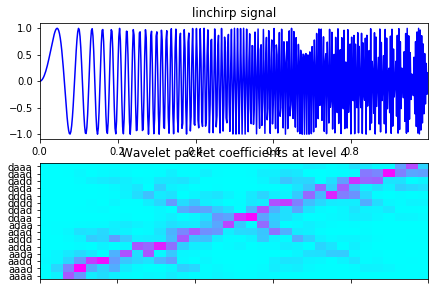

In [4]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-

import matplotlib.cm as cm
import pylab

import pywt

x = pylab.arange(0, 1, 1. / 512)
data = pylab.sin((5 * 50 * pylab.pi * x ** 2))

wavelet = 'db2'
level = 4
order = "freq"  # "normal"
interpolation = 'nearest'
cmap = cm.cool

wp = pywt.WaveletPacket(data, wavelet, 'sym', maxlevel=level)
nodes = wp.get_level(level, order=order)
labels = [n.path for n in nodes]
values = pylab.array([n.data for n in nodes], 'd')
values = abs(values)

f = pylab.figure()
f.subplots_adjust(hspace=0.2, bottom=.03, left=.07, right=.97, top=.92)
pylab.subplot(2, 1, 1)
pylab.title("linchirp signal")
pylab.plot(x, data, 'b')
pylab.xlim(0, x[-1])

ax = pylab.subplot(2, 1, 2)
pylab.title("Wavelet packet coefficients at level %d" % level)
pylab.imshow(values, interpolation=interpolation, cmap=cmap, aspect="auto",
    origin="lower", extent=[0, 1, 0, len(values)])
pylab.yticks(pylab.arange(0.5, len(labels) + 0.5), labels)
pylab.setp(ax.get_xticklabels(), visible=False)

#pylab.figure(2)
#pylab.specgram(data, NFFT=64, noverlap=32, cmap=cmap)
#pylab.imshow(values, origin='upper', extent=[-1,1,-1,1],
# interpolation='nearest')

pylab.show()


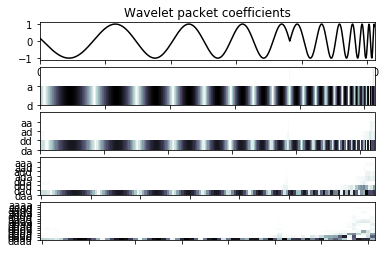

In [6]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-

import numpy
import pylab

from pywt import WaveletPacket

x = numpy.arange(612 - 80, 20, -0.5) / 150.
data = numpy.sin(20 * pylab.log(x)) * numpy.sign((pylab.log(x)))

wp = WaveletPacket(data, 'sym5', maxlevel=4)

pylab.bone()
pylab.subplot(wp.maxlevel + 1, 1, 1)
pylab.plot(data, 'k')
pylab.xlim(0, len(data) - 1)
pylab.title("Wavelet packet coefficients")

for i in range(1, wp.maxlevel + 1):
    ax = pylab.subplot(wp.maxlevel + 1, 1, i + 1)
    nodes = wp.get_level(i, "freq")
    nodes.reverse()
    labels = [n.path for n in nodes]
    values = -abs(numpy.array([n.data for n in nodes]))
    pylab.imshow(values, interpolation='nearest', aspect='auto')
    pylab.yticks(numpy.arange(len(labels) - 0.5, -0.5, -1), labels)
    pylab.setp(ax.get_xticklabels(), visible=False)

pylab.show()


In [13]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-

import pywt
import pylab

data1 = pylab.array((1, 400) + (398, 600) + (601, 1024)) / 1024.
data2 = pylab.arange(612 - 80, 20, -0.5) / 250.
data2 = pylab.sin(40 * pylab.log(data2)) * pylab.sign((pylab.log(data2)))
#from sample_data import ecg as data3

mode = pywt.MODES.sp1
DWT = 1


def plot(data, w, title):
    w = pywt.Wavelet(w)
    a = data
    ca = []
    cd = []

    if DWT:
        for i in xrange(5):
            (a, d) = pywt.dwt(a, w, mode)
            ca.append(a)
            cd.append(d)
    else:
        coeffs = pywt.swt(data, w, 5)  # [(cA5, cD5), ..., (cA1, cD1)]
        for a, d in reversed(coeffs):
            ca.append(a)
            cd.append(d)

    pylab.figure()
    ax_main = pylab.subplot(len(ca) + 1, 1, 1)
    pylab.title(title)
    ax_main.plot(data)
    pylab.xlim(0, len(data) - 1)

    for i, x in enumerate(ca):
        ax = pylab.subplot(len(ca) + 1, 2, 3 + i * 2)
        ax.plot(x, 'r')
        if DWT:
            pylab.xlim(0, len(x) - 1)
        else:
            pylab.xlim(w.dec_len * i, len(x) - 1 - w.dec_len * i)
        pylab.ylabel("A%d" % (i + 1))

    for i, x in enumerate(cd):
        ax = pylab.subplot(len(cd) + 1, 2, 4 + i * 2)
        ax.plot(x, 'g')
        pylab.xlim(0, len(x) - 1)
        if DWT:
            pylab.ylim(min(0, 1.4 * min(x)), max(0, 1.4 * max(x)))
        else:  # SWT
            pylab.ylim(
                min(0, 2 * min(
                    x[w.dec_len * (1 + i):len(x) - w.dec_len * (1 + i)])),
                max(0, 2 * max(
                    x[w.dec_len * (1 + i):len(x) - w.dec_len * (1 + i)]))
            )
        pylab.ylabel("D%d" % (i + 1))


DWT = 1
plot(data1, 'db1', "DWT: Signal irregularity shown in D1 - Haar wavelet")
plot(data2, 'sym5', "DWT: Frequency and phase change - Symmlets5")
#plot(data3, 'sym5', "DWT: Ecg sample - Symmlets5")

DWT = 0  # SWT
plot(data1, 'db1', "SWT: Signal irregularity detection - Haar wavelet")
plot(data2, 'sym5', "SWT: Frequency and phase change - Symmlets5")
#plot(data3, 'sym5', "SWT: Ecg sample - simple QRS detection - Symmlets5")

pylab.show()


NameError: name 'xrange' is not defined

# Scaleogram
From: 

https://github.com/alsauve/scaleogram/tree/master/lib/scaleogram

https://www.kaggle.com/asauve/a-gentle-introduction-to-wavelet-for-data-analysis


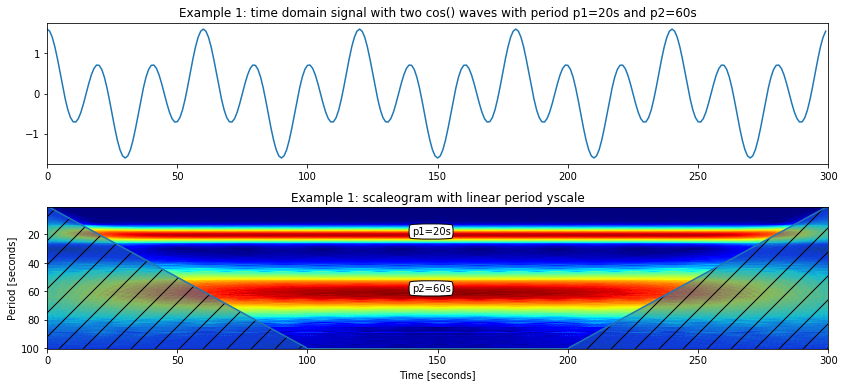

In [1]:
import scaleogram as scg 
import numpy as np
import matplotlib.pyplot as plt
n = 300
time = np.arange(n)
p1    = 20;  f1 = 1./p1
p2    = 60; f2 = 1./p2
data = np.cos( (2*np.pi*f1) * time) + 0.6*np.cos( (2*np.pi*f2) * time)
wavelet='cmor0.7-1.5'

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 6))
fig.subplots_adjust(hspace=0.3)
ax1.plot(time, data); ax1.set_xlim(0, n)
ax1.set_title('Example 1: time domain signal with two cos() waves with period p1=%ds and p2=%ds'%(p1,p2))
ax2 = scg.cws(time, data, scales=np.arange(1, 150), wavelet=wavelet,
        ax=ax2, cmap="jet", cbar=None, ylabel="Period [seconds]", xlabel="Time [seconds]",
        title='Example 1: scaleogram with linear period yscale')
txt = ax2.annotate("p1=%ds" % p1, xy=(n/2,p1), xytext=(n/2-10, p1), bbox=dict(boxstyle="round4", fc="w"))
txt = ax2.annotate("p2=%ds" % p2, xy=(n/2,p2), xytext=(n/2-10, p2), bbox=dict(boxstyle="round4", fc="w"))